In [63]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from tensorflow.keras.utils import plot_model
from sklearn.preprocessing import MinMaxScaler
import plotly.express as px
from sklearn.linear_model import Ridge, Lasso
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV

In [64]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Hourly Minneapolis-St Paul, MN traffic volume for westbound I-94. Includes weather and holiday features from 2012 to 2018. Link to dataset: https://archive.ics.uci.edu/dataset/492/metro+interstate+traffic+volume

The goal of this analysis is to forecast traffic volume.

Variables information:

* holiday Categorical US National holidays plus regional holidays, Minnesota State Fair

* temp Numeric Average temp in kelvin

* rain_1h Numeric Amount in mm of rain that occurred in the hour

* snow_1h Numeric Amount in mm of snow that occurred in the hour

* clouds_all Numeric Percentage of cloud cover

* weather_main Categorical Short textual description of the current weather

* weather_description Categorical Longer textual description of the current weather

* date_time DateTime Hour of the data collected in local CST time

* traffic_volume Numeric Hourly I-94 ATR 301 reported westbound traffic volume

In [65]:
data = pd.read_csv("/content/drive/MyDrive/traffic_data/Metro_Interstate_Traffic_Volume.csv")
data.head()

,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,date_time,traffic_volume
0,None,288.28,0.0,0.0,40,Clouds,scattered clouds,2012-10-02 09:00:00,5545
1,None,289.36,0.0,0.0,75,Clouds,broken clouds,2012-10-02 10:00:00,4516
2,None,289.58,0.0,0.0,90,Clouds,overcast clouds,2012-10-02 11:00:00,4767
3,None,290.13,0.0,0.0,90,Clouds,overcast clouds,2012-10-02 12:00:00,5026
4,None,291.14,0.0,0.0,75,Clouds,broken clouds,2012-10-02 13:00:00,4918


In [66]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48204 entries, 0 to 48203
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   holiday              48204 non-null  object 
 1   temp                 48204 non-null  float64
 2   rain_1h              48204 non-null  float64
 3   snow_1h              48204 non-null  float64
 4   clouds_all           48204 non-null  int64  
 5   weather_main         48204 non-null  object 
 6   weather_description  48204 non-null  object 
 7   date_time            48204 non-null  object 
 8   traffic_volume       48204 non-null  int64  
dtypes: float64(3), int64(2), object(4)
memory usage: 3.3+ MB


# Data Preprocessing. Part I

## Data cleaning steps:

* Check the tidiness of the data (observations on rows and variables on the columns).

* Remove duplicates.

* Each observation should have a unique ID.

* Check homogeneity (observation in the same column should have the same format).

* Check data types

**Tidiness**. As we can see, the dataset is tidy.

Let's check for **duplicates**:

In [67]:
data[data.duplicated()]

,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,date_time,traffic_volume
18697,None,286.290,0.0,0.0,1,Clear,sky is clear,2015-09-30 19:00:00,3679
23851,None,289.060,0.0,0.0,90,Clouds,overcast clouds,2016-06-01 10:00:00,4831
26784,None,289.775,0.0,0.0,56,Clouds,broken clouds,2016-09-21 15:00:00,5365
26980,None,287.860,0.0,0.0,0,Clear,Sky is Clear,2016-09-29 19:00:00,3435
27171,None,279.287,0.0,0.0,56,Clouds,broken clouds,2016-10-07 18:00:00,4642
28879,None,267.890,0.0,0.0,90,Snow,light snow,2016-12-06 18:00:00,4520
29268,None,254.220,0.0,0.0,1,Clear,sky is clear,2016-12-19 00:00:00,420
34711,None,295.010,0.0,0.0,40,Clouds,scattered clouds,2017-06-21 11:00:00,4808
34967,None,292.840,0.0,0.0,1,Clear,sky is clear,2017-06-30 10:00:00,4638
34969,None,294.520,0.0,0.0,1,Clear,sky is clear,2017-06-30 11:00:00,4725


The duplicates should be removed:

In [68]:
data_clean = data.drop_duplicates().copy()

**Unique ID.** The date_time column can be used as a unique ID for each observation. Python also automatically adjusts the index column.


In [69]:
data_clean.set_index("date_time", inplace=True)
data_clean.head()

,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,traffic_volume
date_time,,,,,,,,
2012-10-02 09:00:00,None,288.28,0.0,0.0,40,Clouds,scattered clouds,5545
2012-10-02 10:00:00,None,289.36,0.0,0.0,75,Clouds,broken clouds,4516
2012-10-02 11:00:00,None,289.58,0.0,0.0,90,Clouds,overcast clouds,4767
2012-10-02 12:00:00,None,290.13,0.0,0.0,90,Clouds,overcast clouds,5026
2012-10-02 13:00:00,None,291.14,0.0,0.0,75,Clouds,broken clouds,4918


**Homogeneity.** The observations in each column have the same format. However, the temperature feature format would be changed from Kelvin to Celcius for simplicity and interpretability.

In [70]:
data_clean.loc[:, "temp"] = data_clean["temp"] - 273.15
data_clean.head()

,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,traffic_volume
date_time,,,,,,,,
2012-10-02 09:00:00,None,15.13,0.0,0.0,40,Clouds,scattered clouds,5545
2012-10-02 10:00:00,None,16.21,0.0,0.0,75,Clouds,broken clouds,4516
2012-10-02 11:00:00,None,16.43,0.0,0.0,90,Clouds,overcast clouds,4767
2012-10-02 12:00:00,None,16.98,0.0,0.0,90,Clouds,overcast clouds,5026
2012-10-02 13:00:00,None,17.99,0.0,0.0,75,Clouds,broken clouds,4918


**Data types.** The date_time column is represented as a character string. It should be converted to the datetime type. In the dataset, the date_time column is represented by using ISO 8601.

In [71]:
# convert the index to datetime format
data_clean.index = pd.to_datetime(data_clean.index)
data_clean.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 48187 entries, 2012-10-02 09:00:00 to 2018-09-30 23:00:00
Data columns (total 8 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   holiday              48187 non-null  object 
 1   temp                 48187 non-null  float64
 2   rain_1h              48187 non-null  float64
 3   snow_1h              48187 non-null  float64
 4   clouds_all           48187 non-null  int64  
 5   weather_main         48187 non-null  object 
 6   weather_description  48187 non-null  object 
 7   traffic_volume       48187 non-null  int64  
dtypes: float64(3), int64(2), object(3)
memory usage: 3.3+ MB


**Missing values**

*The best thing to do with missing values is not to have any.*

**Gertrude Mary Cox**

So, the first thing to do is check for any missing values.

In [72]:
print(data_clean.isna().sum())

holiday                0
temp                   0
rain_1h                0
snow_1h                0
clouds_all             0
weather_main           0
weather_description    0
traffic_volume         0
dtype: int64



# Explorary data analysis

Let's create additional features for futher analysis.

In [73]:
# Split datetime index into features
data_clean['hour'] = data_clean.index.hour
data_clean['month'] = data_clean.index.month
data_clean['year'] = data_clean.index.year

### Numerical values

The dataset has too much data to be displayed in an understandable way. Due to this fact, the library plotly has been used. That package helps to create interactive plots that can be zoomed in.

In [74]:
fig = px.line(data_clean, x=data_clean.index, y="traffic_volume", title="Traffic Volume")
fig.update_xaxes(title_text="Time")
fig.update_yaxes(title_text="Traffic Volume")

fig.show()

After zooming in and seeing the first days, the existence of seasonality can be assumed. There is no trend. Also, the dataset has a period of unrecorded data.
According to the observations, the repetitive pattern that occurred in the data has a daily nature.

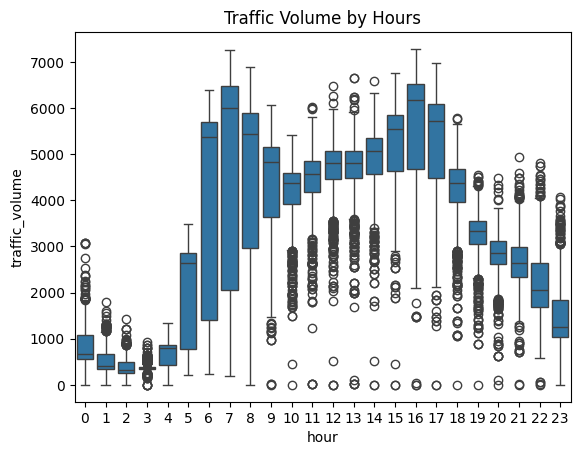

In [75]:
sns.boxplot(y=data_clean['traffic_volume'], x=data_clean['hour'])

plt.title('Traffic Volume by Hours')

plt.show()

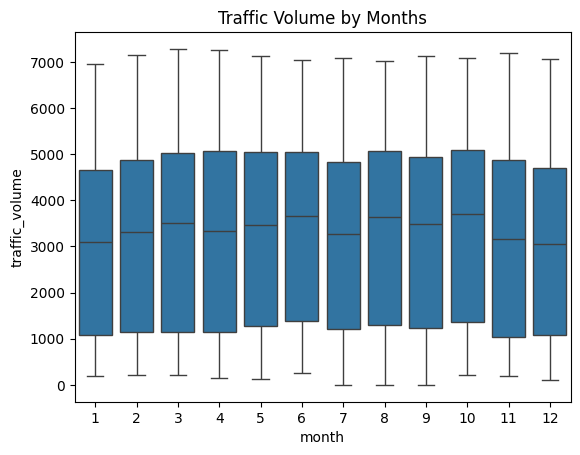

In [76]:
sns.boxplot(y=data_clean['traffic_volume'], x=data_clean['month'])

plt.title('Traffic Volume by Months')

plt.show()

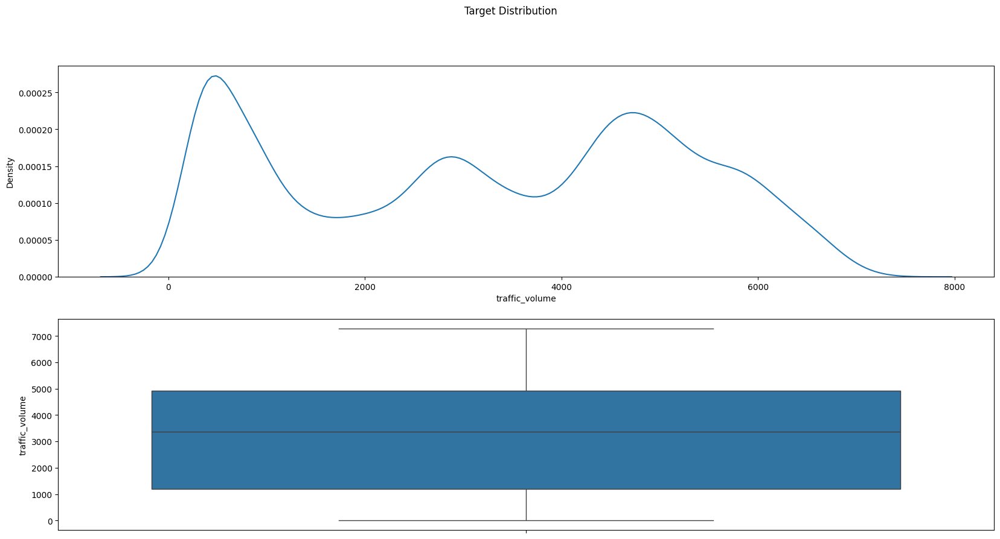

In [77]:
fig, ax = plt.subplots(2,1,figsize=(20,10))
fig.suptitle('Target Distribution')

sns.kdeplot(data_clean['traffic_volume'], ax=ax[0])
sns.boxplot(data_clean['traffic_volume'], ax=ax[1])

plt.show()

Let`s create a plot for temperature.

In [78]:
fig = px.line(data_clean, x=data_clean.index, y="temp", title="Temperature")
fig.update_xaxes(title_text="Time")
fig.update_yaxes(title_text="Temperature")

fig.show()

For temperature, the situation is the same. There is no trend, but there is cycle behaviour. Also, it is easy to see two outliers. It's better to deal with them now.

In [79]:
data_clean['temp'][data_clean['temp'] < -200] = np.nan

# Replace NA with the previous non-NA value
data_clean['temp'].fillna(method='ffill', inplace=True)

<ipython-input-79-f36f3cf5b423>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [80]:
fig = px.line(data_clean, x=data_clean.index, y="temp", title="Temperature")
fig.update_xaxes(title_text="Time")
fig.update_yaxes(title_text="Temperature")

fig.show()

Plot of the column clouds_all

In [81]:
fig = px.line(data_clean, x=data_clean.index, y="clouds_all", title="Percentage of cloud cover")
fig.update_xaxes(title_text="Time")
fig.update_yaxes(title_text="Percentage of cloud cover")

fig.show()

Even after scaling, the column clouds_all has not shown any signs of seasonal or cyclic behaviour.

Plot of rain_1h

In [82]:
fig = px.line(data_clean, x=data_clean.index, y="rain_1h", title="Amount in mm of rain that occurred in the hour")
fig.update_xaxes(title_text="Time")
fig.update_yaxes(title_text="Amount in mm of rain that occurred in the hour")

fig.show()

Also, it is easy to see one outlier. It's better to deal with it now.

In [83]:
data_clean['rain_1h'][data_clean['rain_1h'] > 1000] = np.nan

# Replace NA with the previous non-NA value
data_clean['rain_1h'].fillna(method='ffill', inplace=True)

<ipython-input-83-83443145401c>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [84]:
fig = px.line(data_clean, x=data_clean.index, y="rain_1h", title="Amount in mm of rain that occurred in the hour")
fig.update_xaxes(title_text="Time")
fig.update_yaxes(title_text="Amount in mm of rain that occurred in the hour")

fig.show()

Plot of snow_1h

In [85]:
fig = px.line(data_clean, x=data_clean.index, y="snow_1h", title="Amount in mm of snow that occurred in the hour")
fig.update_xaxes(title_text="Time")
fig.update_yaxes(title_text="Amount in mm of snow that occurred in the hour")

fig.show()

Distribution of numerical variables

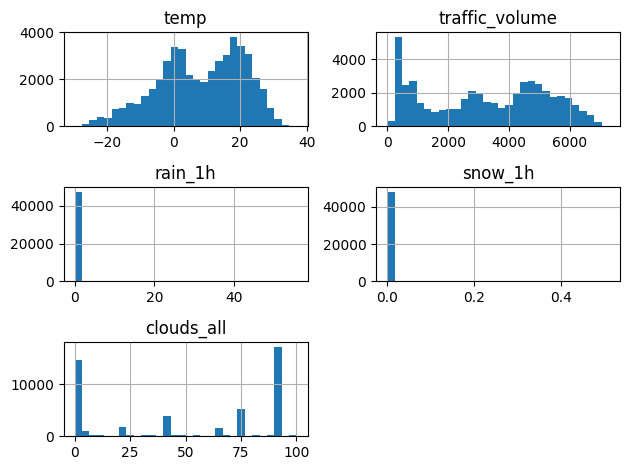

In [86]:
cols = ["temp", "traffic_volume", "rain_1h", "snow_1h", "clouds_all"]

data_clean[cols].hist(bins=30)

plt.ylabel("Frequency")
plt.tight_layout()

plt.show()

### Categorical values

Exploring categorical values. Possible values of the categorical columns.

In [87]:
data_clean.holiday.value_counts()

None                         48126
Labor Day                        7
Thanksgiving Day                 6
Christmas Day                    6
New Years Day                    6
Martin Luther King Jr Day        6
Columbus Day                     5
Veterans Day                     5
Washingtons Birthday             5
Memorial Day                     5
Independence Day                 5
State Fair                       5
Name: holiday, dtype: int64

 There are less than 5 % Holiday values in the entire Data

In [88]:
data_clean['holiday'] = [0 if holiday == 'None' else 1 for holiday in data_clean['holiday']]

In [89]:
data_clean

,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,traffic_volume,hour,month,year
date_time,,,,,,,,,,,
2012-10-02 09:00:00,0,15.13,0.0,0.0,40,Clouds,scattered clouds,5545,9,10,2012
2012-10-02 10:00:00,0,16.21,0.0,0.0,75,Clouds,broken clouds,4516,10,10,2012
2012-10-02 11:00:00,0,16.43,0.0,0.0,90,Clouds,overcast clouds,4767,11,10,2012
2012-10-02 12:00:00,0,16.98,0.0,0.0,90,Clouds,overcast clouds,5026,12,10,2012
2012-10-02 13:00:00,0,17.99,0.0,0.0,75,Clouds,broken clouds,4918,13,10,2012
...,...,...,...,...,...,...,...,...,...,...,...
2018-09-30 19:00:00,0,10.30,0.0,0.0,75,Clouds,broken clouds,3543,19,9,2018
2018-09-30 20:00:00,0,9.61,0.0,0.0,90,Clouds,overcast clouds,2781,20,9,2018
2018-09-30 21:00:00,0,9.58,0.0,0.0,90,Thunderstorm,proximity thunderstorm,2159,21,9,2018


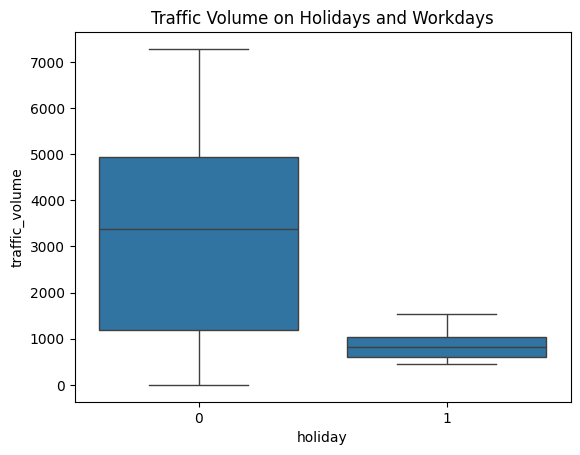

In [90]:
sns.boxplot(y=data_clean['traffic_volume'], x=data_clean['holiday'])

plt.title('Traffic Volume on Holidays and Workdays')

plt.show()

Weather_main column

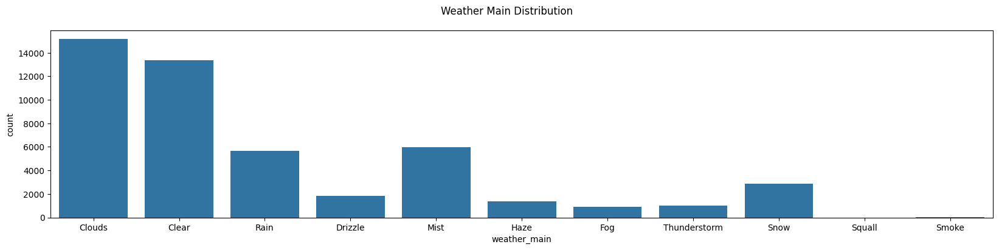

In [91]:
fig, ax = plt.subplots(figsize=(20,4))
fig.suptitle('Weather Main Distribution')

sns.countplot(x=data_clean['weather_main'])

plt.show()

weather_description column

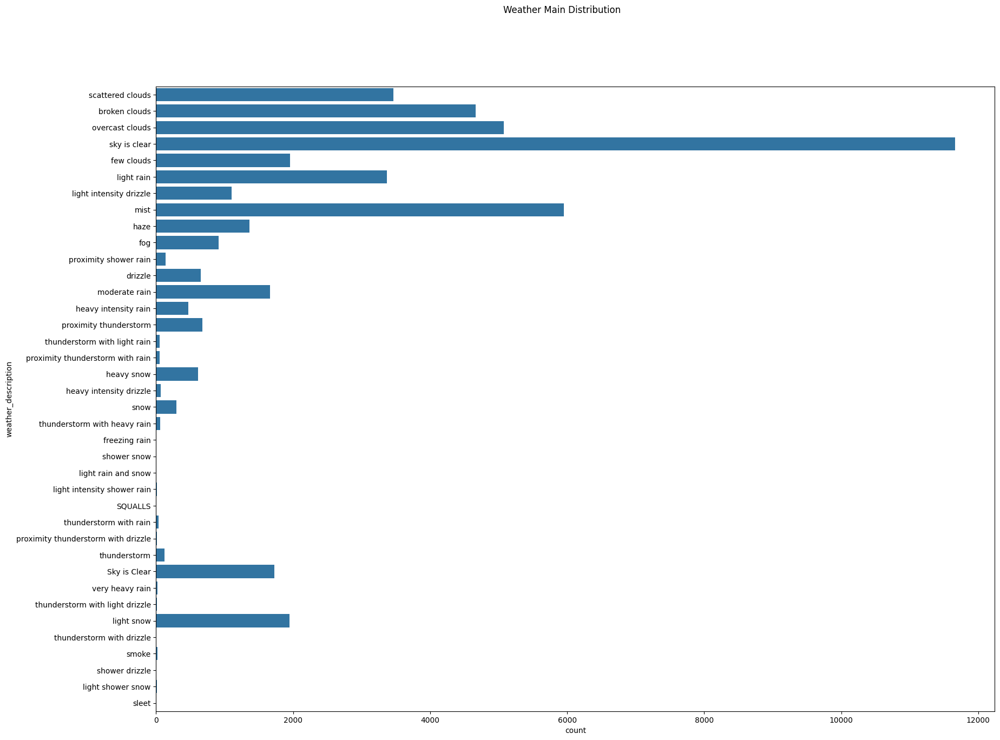

In [92]:
fig, ax = plt.subplots(figsize=(20,15))
fig.suptitle('Weather Main Distribution')

sns.countplot(y=data_clean['weather_description'])

plt.show()

# Interrupted Measurement

For handling this big interval, let's assume that the data of this period is equal to the same values on the same time and date of the previous year.

Let's check the length of the time series.

In [93]:
data_res = data_clean.resample("60min").last().copy()
print(data_res.head())

                     holiday   temp  rain_1h  snow_1h  clouds_all  \
date_time                                                           
2012-10-02 09:00:00      0.0  15.13      0.0      0.0        40.0   
2012-10-02 10:00:00      0.0  16.21      0.0      0.0        75.0   
2012-10-02 11:00:00      0.0  16.43      0.0      0.0        90.0   
2012-10-02 12:00:00      0.0  16.98      0.0      0.0        90.0   
2012-10-02 13:00:00      0.0  17.99      0.0      0.0        75.0   

                    weather_main weather_description  traffic_volume  hour  \
date_time                                                                    
2012-10-02 09:00:00       Clouds    scattered clouds          5545.0   9.0   
2012-10-02 10:00:00       Clouds       broken clouds          4516.0  10.0   
2012-10-02 11:00:00       Clouds     overcast clouds          4767.0  11.0   
2012-10-02 12:00:00       Clouds     overcast clouds          5026.0  12.0   
2012-10-02 13:00:00       Clouds       broken cl

In [94]:
print(data_res.isna().sum())

holiday                11976
temp                   11976
rain_1h                11976
snow_1h                11976
clouds_all             11976
weather_main           11976
weather_description    11976
traffic_volume         11976
hour                   11976
month                  11976
year                   11976
dtype: int64


It is better to pre-process all data together. The algorithm is following:

1. From 2012-10-02 09:00:00 to 2013-10-02 09:00:00, the missing values would be imputed by aggregation. The mean of the previous two values would be calculated for numerical values, and for categorical ones, the previous one would be assigned.

2. The values would be imputed from historical data available for the rest of the data.

In [95]:
# date range from 2012-10-02 09:00:00 to 2013-10-02 10:00:00
date_range = pd.date_range(start='2012-10-02 09:00:00', end='2013-10-02 10:00:00', freq='H')

for timestamp in date_range:
    # Check if the timestamp is missing in the DataFrame
    if timestamp not in data_clean.index:

        for column in data_res.columns:

            if pd.api.types.is_numeric_dtype(data_res[column]):
                # Impute missing numerical values with the mean of the previous two values
                data_res.at[timestamp, column] = data_res[column].loc[:timestamp].tail(2).mean()
            else:
                # Impute missing categorical values with the previous value
                data_res.at[timestamp, column] = data_res[column].loc[:timestamp].fillna(method='ffill', inplace=True)


In [96]:
print(data_res.isna().sum())

holiday                10987
temp                   10987
rain_1h                10987
snow_1h                10987
clouds_all             10987
weather_main           10988
weather_description    10988
traffic_volume         10987
hour                   10987
month                  10987
year                   10987
dtype: int64


In [97]:
while data_res.isnull().any().any():
  for column in data_res.columns:
    data_res[column] = data_res[column].combine_first(data_res[column].shift(365*24))

In [98]:
print(data_res.isna().sum())

holiday                0
temp                   0
rain_1h                0
snow_1h                0
clouds_all             0
weather_main           0
weather_description    0
traffic_volume         0
hour                   0
month                  0
year                   0
dtype: int64


In [99]:
fig = px.line(data_res, x=data_res.index, y="traffic_volume", title="Traffic Volume")
fig.update_xaxes(title_text="Time")
fig.update_yaxes(title_text="Traffic Volume")

fig.show()

In [100]:
fig = px.line(data_res, x=data_res.index, y="temp", title="Temperature")
fig.update_xaxes(title_text="Time")
fig.update_yaxes(title_text="Temperature")

fig.show()

# Pre-processing (scaling, encoding)

The code divides the dataset (data_res) into three subsets: training, validation, and test sets. The percentages percent_train, percent_val, and percent_test determine the allocation of data for each subset. The training set, comprising 70% of the data, is employed to train machine learning models. The subsequent 20% forms the validation set, utilized for evaluation. Finally, the remaining 10% constitutes the test set, reserved for evaluating the model's performance on unseen data.

In [101]:
percent_train = 0.7
percent_val = 0.2
percent_test = 0.1
n = len(data_res)
train_df = data_res[:int(n*percent_train)]
val_df = data_res[int(n*percent_train): int(n*(percent_train+percent_val))]
test_df = data_res[int(n*(1-percent_test)):]

Let's get our data ready. Firstly, the standartization of the numerical variables is needed. Min Max Scaler is used. For categorical features one-hot encoding is used.

In [102]:
scaler = MinMaxScaler()
numerical_columns = train_df.select_dtypes(include=['number']).columns
categorical_columns = train_df.select_dtypes(include=['object']).columns
# train_df = pd.get_dummies(train_df, columns=categorical_columns)
full_df = pd.get_dummies(data_res, columns=categorical_columns)
train_df = full_df[:int(n*percent_train)].copy()
train_df[numerical_columns] = scaler.fit_transform(train_df[numerical_columns])

val_df = full_df[int(n*percent_train): int(n*(percent_train+percent_val))].copy()
val_df[numerical_columns] = scaler.transform(val_df[numerical_columns])

Separate features from target

In [103]:
train_X = train_df.drop(['traffic_volume'],axis=1).copy()
train_y = train_df['traffic_volume'].copy()

In [104]:
val_X = val_df.drop(['traffic_volume'],axis=1).copy()
val_y = val_df['traffic_volume'].copy()

Prepare the test data

In [105]:
test_df = full_df[int(n*(1-percent_test)):].copy()
test_df[numerical_columns] = scaler.transform(test_df[numerical_columns])

In [106]:
test_X = test_df.drop(['traffic_volume'],axis=1).copy()
test_y = test_df['traffic_volume'].copy()

Create the list for saving the mean squared error for different models.

In [107]:
mse_score = []

# Regresions

## Ridge regression

In [108]:
ridge_params = {'alpha':[0.1, 0.5, 1.0, 1.1, 1.5, 2.0, 2.1, 2.5, 3.0]}
ridge_model = Ridge()

search = GridSearchCV(ridge_model, ridge_params, scoring='neg_mean_squared_error')
# perform the search
results_ridge = search.fit(train_X, train_y)

print('MSE:', results_ridge.best_score_)
print('Config:', results_ridge.best_params_)

MSE: -0.06479659671885887
Config: {'alpha': 3.0}


In [109]:
ridge_model_3 = Ridge(alpha=3.0)

ridge_model_3.fit(train_X, train_y)

y_pred_ridge = ridge_model_3.predict(test_X)

mse_ridge_3 = mean_squared_error(test_y, y_pred_ridge)
mse_ridge_3

0.06433407491840962

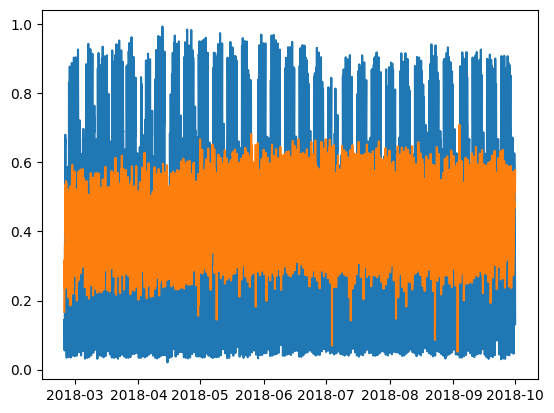

In [110]:
for series_num in (test_y, y_pred_ridge):
  plt.plot(test_y.index, series_num)

In [111]:
mse_score.append(('Ridge', mse_ridge_3))

## Lasso regression

In [112]:
lasso_params = {'alpha':[0.01, 0.02, 0.04, 0.05, 0.1, 0.5, 1.0, 1.1, 1.5]}
lasso_model = Lasso()

search_lasso = GridSearchCV(lasso_model, lasso_params, scoring='neg_mean_squared_error')
# perform the search
results = search_lasso.fit(train_X, train_y)

print('MSE:', results.best_score_)
print('Config:', results.best_params_)

MSE: -0.06745782246802436
Config: {'alpha': 0.01}


In [113]:
lasso_model_0_01 = Lasso(alpha=0.01)
lasso_model_0_01.fit(train_X, train_y)
y_pred_lasso = lasso_model_0_01.predict(test_X)

mse_lasso_0_01 = mean_squared_error(test_y, y_pred_lasso)
mse_lasso_0_01

0.06655715719798179

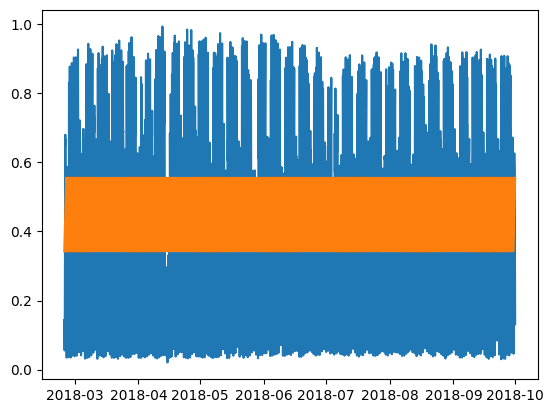

In [114]:
for series_num in (test_y, y_pred_lasso):
  plt.plot(test_y.index, series_num)

In [115]:
mse_score.append(('Lasso', mse_lasso_0_01))

# Neural networks

## RNN

A Recurrent Neural Network, or RNN is a neural network that contains recurrent layers. These are designed to sequentially processes sequence of inputs. RNNs are pretty flexible, able to process all kinds of sequences.

SimpleRNN layers expect a 3-dimensional tensor input with the shape [batch, timesteps, feature].

In [116]:
window_size = 48
batch_size = 20
n_features = 1

Let's create a function for presenting the data in way appropriate for RNN model.  

In [117]:
def windowed_dataset(series, window_size, batch_size, forecast=False):

    dataset = tf.data.Dataset.from_tensor_slices(series)

    if forecast == True: # dataset is used for forecast or no
      f = 0
    else:
      f = 1

    # window the data
    dataset = dataset.window(window_size + f, shift=1, drop_remainder=True)

    # flatten the windows
    dataset = dataset.flat_map(lambda window: window.batch(window_size + f))

    if forecast == False:
      # create tuples with features and labels
      dataset = dataset.map(lambda window: (window[:-1], window[-1]))

    # create batches of windows
    dataset = dataset.batch(batch_size).prefetch(1)

    return dataset

Generate training and validation datasets.

In [118]:
train_y_reshaped = train_y.values.reshape(-1, 1)
val_y_reshaped = val_y.values.reshape(-1, 1)

In [119]:
dataset_train = windowed_dataset(train_y_reshaped, window_size, batch_size)
dataset_val = windowed_dataset(val_y_reshaped, window_size, batch_size)

Let look at the shape of the data.

In [120]:
for window in dataset_train.take(1):
  print(f'shape of feature: {window[0].shape}')
  print(f'shape of label: {window[1].shape}')

shape of feature: (20, 48, 1)
shape of label: (20, 1)


Create the the simple model. Due to big amount of data, the time required for training complex model would be huge.

In [121]:
model_rnn = tf.keras.models.Sequential([
  tf.keras.layers.SimpleRNN(40,
                    input_shape=(window_size, n_features),
                         activation = "tanh", return_sequences=True),
  tf.keras.layers.SimpleRNN(40, activation = "tanh", return_sequences=True),
  tf.keras.layers.SimpleRNN(40, activation = "tanh"),
  tf.keras.layers.Dense(1, activation='sigmoid'),
])

model_rnn.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_3 (SimpleRNN)    (None, 48, 40)            1680      
                                                                 
 simple_rnn_4 (SimpleRNN)    (None, 48, 40)            3240      
                                                                 
 simple_rnn_5 (SimpleRNN)    (None, 40)                3240      
                                                                 
 dense_1 (Dense)             (None, 1)                 41        
                                                                 
Total params: 8201 (32.04 KB)
Trainable params: 8201 (32.04 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


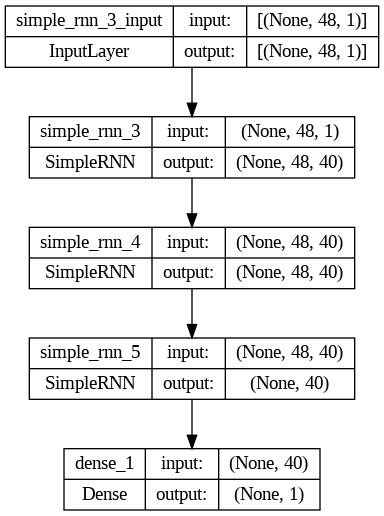

In [122]:
plot_model(model_rnn, show_shapes=True, show_layer_names=True)

In [123]:
# Set the learning rate scheduler
lr_schedule = tf.keras.callbacks.LearningRateScheduler(
    lambda epoch: 1e-8 * 10**(epoch / 4))

optimizer = tf.keras.optimizers.legacy.SGD(momentum=0.9)

# Set the training parameters
model_rnn.compile(loss='mean_absolute_error', optimizer=optimizer)

# Train the model
history_lr = model_rnn.fit(dataset_train, epochs=20, validation_data=dataset_val, callbacks=[lr_schedule])

Epoch 1/20
1837/1837 [==============================] - 71s 38ms/step - loss: 0.2863 - val_loss: 0.2912 - lr: 1.0000e-08
Epoch 2/20
1837/1837 [==============================] - 66s 36ms/step - loss: 0.2861 - val_loss: 0.2908 - lr: 1.7783e-08
Epoch 3/20
1837/1837 [==============================] - 64s 35ms/step - loss: 0.2856 - val_loss: 0.2901 - lr: 3.1623e-08
Epoch 4/20
1837/1837 [==============================] - 65s 35ms/step - loss: 0.2845 - val_loss: 0.2886 - lr: 5.6234e-08
Epoch 5/20
1837/1837 [==============================] - 64s 35ms/step - loss: 0.2826 - val_loss: 0.2859 - lr: 1.0000e-07
Epoch 6/20
1837/1837 [==============================] - 63s 34ms/step - loss: 0.2792 - val_loss: 0.2813 - lr: 1.7783e-07
Epoch 7/20
1837/1837 [==============================] - 65s 35ms/step - loss: 0.2736 - val_loss: 0.2738 - lr: 3.1623e-07
Epoch 8/20
1837/1837 [==============================] - 69s 38ms/step - loss: 0.2650 - val_loss: 0.2627 - lr: 5.6234e-07
Epoch 9/20
1837/1837 [==========

As we can see, the loss does not a lot change during training. The reasons for this can be various. Too small or too big learning rate, because of which model ended up in the local minimum. Also the reason can be simplicity of the proposed model, and model does not catch the features of the data.

Let's try to tune the learning rate of our model.

Let's train the model.

In [124]:
optimizer = tf.keras.optimizers.legacy.SGD(learning_rate=5.6234e-04, momentum=0.9, nesterov=True)

# Set the training parameters
model_rnn.compile(loss='mean_absolute_error', optimizer=optimizer)

history = model_rnn.fit(dataset_train, epochs=10, validation_data=dataset_val)

Epoch 1/10
1837/1837 [==============================] - 81s 43ms/step - loss: 0.0507 - val_loss: 0.0386
Epoch 2/10
1837/1837 [==============================] - 72s 39ms/step - loss: 0.0483 - val_loss: 0.0367
Epoch 3/10
1837/1837 [==============================] - 68s 37ms/step - loss: 0.0465 - val_loss: 0.0353
Epoch 4/10
1837/1837 [==============================] - 70s 38ms/step - loss: 0.0452 - val_loss: 0.0343
Epoch 5/10
1837/1837 [==============================] - 68s 37ms/step - loss: 0.0441 - val_loss: 0.0336
Epoch 6/10
1837/1837 [==============================] - 70s 38ms/step - loss: 0.0432 - val_loss: 0.0326
Epoch 7/10
1837/1837 [==============================] - 70s 38ms/step - loss: 0.0426 - val_loss: 0.0319
Epoch 8/10
1837/1837 [==============================] - 71s 39ms/step - loss: 0.0420 - val_loss: 0.0317
Epoch 9/10
1837/1837 [==============================] - 72s 39ms/step - loss: 0.0416 - val_loss: 0.0315
Epoch 10/10
1837/1837 [==============================] - 72s 39m

In [125]:
# Reduce the series
forecast_series = test_y[:]
test_windows = windowed_dataset(forecast_series, window_size, batch_size, forecast=True)
forecast_rnn = model_rnn.predict(test_windows)

261/261 [==============================] - 3s 11ms/step


In [126]:
results_rnn = np.array(forecast_rnn).squeeze()

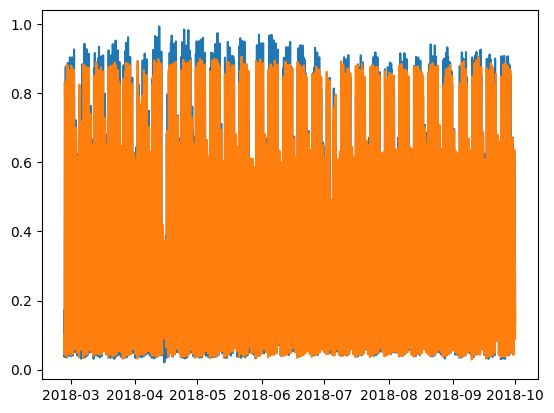

In [127]:
results_rnn = np.array(results_rnn).squeeze()
for series_num in (test_y[window_size-1:], results_rnn):
  plt.plot(test_y[window_size-1:].index, series_num)

In [128]:
print("MSE:", tf.keras.metrics.mean_squared_error(test_y[window_size-1:], results_rnn).numpy().mean())
print("MAE:", tf.keras.metrics.mean_absolute_error(test_y[window_size-1:], results_rnn).numpy().mean())

MSE: 0.01147554
MAE: 0.07912524


As we can see the results are not very good. It better to try with more complex model, such as Long-Short Term Memory.

In [129]:
mse_score.append(('RNN', tf.keras.metrics.mean_squared_error(test_y[window_size-1:], results_rnn).numpy().mean()))

## Long-Short Term Memory

LSTMs are much more complex in their internal architecture than simpleRNNs. It implements a cell state that allows it to remember sequences better than simple implementations. This added complexity results in a bigger set of parameters to train. Let's try to use it to improve the accuracy of the predictions.

In [130]:
model_lstm = tf.keras.models.Sequential([
  tf.keras.layers.LSTM(40, return_sequences=True, input_shape=(window_size, n_features)),
  tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(40)),
  tf.keras.layers.Dense(1),
])

# Print the model summary
model_lstm.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 48, 40)            6720      
                                                                 
 bidirectional (Bidirection  (None, 80)                25920     
 al)                                                             
                                                                 
 dense_2 (Dense)             (None, 1)                 81        
                                                                 
Total params: 32721 (127.82 KB)
Trainable params: 32721 (127.82 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


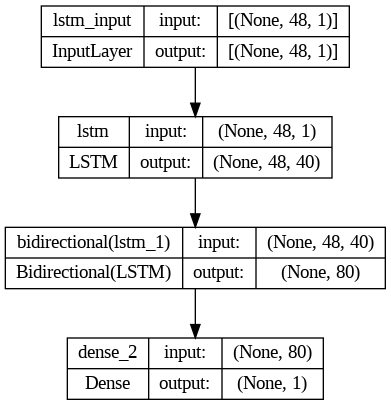

In [131]:
plot_model(model_lstm, show_shapes=True, show_layer_names=True)

In [132]:
# Set the learning rate scheduler
lr_schedule = tf.keras.callbacks.LearningRateScheduler(
    lambda epoch: 1e-8 * 10**(epoch / 4))

optimizer = tf.keras.optimizers.legacy.SGD(momentum=0.9)

# Set the training parameters
model_lstm.compile(loss='mean_absolute_error', optimizer=optimizer)

# Train the model
history_lr = model_lstm.fit(dataset_train, epochs=20, validation_data=dataset_val, callbacks=[lr_schedule])

Epoch 1/20
1837/1837 [==============================] - 126s 66ms/step - loss: 0.4842 - val_loss: 0.4956 - lr: 1.0000e-08
Epoch 2/20
1837/1837 [==============================] - 120s 65ms/step - loss: 0.4832 - val_loss: 0.4943 - lr: 1.7783e-08
Epoch 3/20
1837/1837 [==============================] - 118s 64ms/step - loss: 0.4814 - val_loss: 0.4920 - lr: 3.1623e-08
Epoch 4/20
1837/1837 [==============================] - 119s 65ms/step - loss: 0.4781 - val_loss: 0.4877 - lr: 5.6234e-08
Epoch 5/20
1837/1837 [==============================] - 118s 64ms/step - loss: 0.4721 - val_loss: 0.4801 - lr: 1.0000e-07
Epoch 6/20
1837/1837 [==============================] - 120s 65ms/step - loss: 0.4616 - val_loss: 0.4665 - lr: 1.7783e-07
Epoch 7/20
1837/1837 [==============================] - 130s 71ms/step - loss: 0.4429 - val_loss: 0.4425 - lr: 3.1623e-07
Epoch 8/20
1837/1837 [==============================] - 128s 70ms/step - loss: 0.4105 - val_loss: 0.4027 - lr: 5.6234e-07
Epoch 9/20
1837/1837 [==

In [133]:
optimizer = tf.keras.optimizers.legacy.SGD(learning_rate=5.6234e-04, decay=1e-6, momentum=0.9, nesterov=True)

# Set the training parameters
model_lstm.compile(loss='mean_absolute_error', optimizer=optimizer)

history = model_lstm.fit(dataset_train, epochs=20, validation_data=dataset_val)

Epoch 1/20
1837/1837 [==============================] - 124s 65ms/step - loss: 0.1076 - val_loss: 0.1009
Epoch 2/20
1837/1837 [==============================] - 116s 63ms/step - loss: 0.1037 - val_loss: 0.0981
Epoch 3/20
1837/1837 [==============================] - 114s 62ms/step - loss: 0.1015 - val_loss: 0.0960
Epoch 4/20
1837/1837 [==============================] - 116s 63ms/step - loss: 0.0998 - val_loss: 0.0942
Epoch 5/20
1837/1837 [==============================] - 117s 63ms/step - loss: 0.0984 - val_loss: 0.0930
Epoch 6/20
1837/1837 [==============================] - 122s 66ms/step - loss: 0.0972 - val_loss: 0.0918
Epoch 7/20
1837/1837 [==============================] - 115s 62ms/step - loss: 0.0961 - val_loss: 0.0910
Epoch 8/20
1837/1837 [==============================] - 118s 64ms/step - loss: 0.0950 - val_loss: 0.0898
Epoch 9/20
1837/1837 [==============================] - 108s 59ms/step - loss: 0.0940 - val_loss: 0.0886
Epoch 10/20
1837/1837 [==============================] 

It's easy to that the LSTM definitely outperform the RNN model.
Indeed, it would be good to do also parameter tuning (as was done for RNN). However, the trainning is time consuming.

In [134]:
forecast_series = test_y[:]
test_windows = windowed_dataset(forecast_series, window_size, batch_size, forecast=True)
forecast_lstm = model_lstm.predict(test_windows)

261/261 [==============================] - 7s 17ms/step


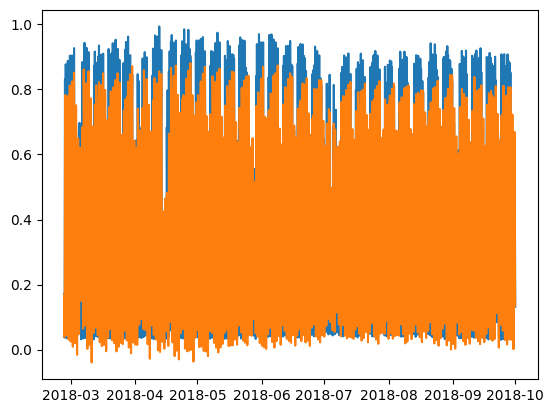

In [135]:
results_lstm = np.array(forecast_lstm).squeeze()
for series_num in (test_y[window_size-1:], results_lstm):
  plt.plot(test_y[window_size-1:].index, series_num)

In [136]:
print(tf.keras.metrics.mean_squared_error(test_y[window_size-1:], results_lstm).numpy().mean())
print(tf.keras.metrics.mean_absolute_error(test_y[window_size-1:], results_lstm).numpy().mean())

0.0069072647
0.063021235


In [137]:
mse_score.append(('LSTM', tf.keras.metrics.mean_squared_error(test_y[window_size-1:], results_lstm).numpy().mean()))

The results demostrate that RNN model is more accurate.

# Results

In [138]:
df_results = pd.DataFrame(mse_score, columns=['Model', 'MSE'])

print(df_results)

   Model       MSE
0  Ridge  0.064334
1  Lasso  0.066557
2    RNN  0.011476
3   LSTM  0.006907
